<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Ethan Crawford
    Math 346
    11/29/22

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [3]:
from matplotlib import pyplot as plt
import math
from scipy.io import wavfile
import numpy as np
import IPython
from scipy import fftpack
from scipy import signal
import time as time
import imageio.v2 as imageio
from scipy.fftpack import fft2, ifft2

In [4]:
plt.rcParams["figure.dpi"] = 300
plt.rcParams["figure.figsize"] = (12,3)

In [5]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples

    # Problems 1.1 and 1.7
    def plot(self, prob7=False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        # Calculate the length of the sound wave in seconds
        wave_length = len(self.samples)/self.rate

        #Create a linspace from 0 to the length of the wave
        seconds = np.linspace(0,wave_length, len(self.samples))

        if not prob7:
            # Plot the wave
            plt.plot(seconds,self.samples)
            plt.axis([0, wave_length, -32768, 32767])
            plt.xlabel("Seconds")
            plt.ylabel("Amplitude of Samples")
            plt.title("Sound Wave Plot", size=18)
            plt.show()

        if prob7:
            # Get dft samples
            dft_samples = fftpack.fft(self.samples)

            #Get frequency
            k = np.arange(len(dft_samples)//2)
            freq = k*self.rate/len(self.samples)
            mag = np.abs(dft_samples[:len(dft_samples)//2])

            plt.plot(freq, mag)
            plt.xlabel("Frequency Hz")
            plt.ylabel("Magnitude")
            plt.title("Sound Wave Plot", size=18)
            plt.show()

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        # If the samples aren't a 16 bit int, scale the samples and export
        if force or (self.samples.dtype is not np.int16):
            scaled_samples = np.int16((self.samples/max(np.abs(self.samples))) * 32767)
            wavfile.write(filename, self.rate, scaled_samples)
        else:
            wavfile.write(filename, self.rate, self.samples)
        
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        if len(self.samples) != len(other.samples):
            raise ValueError("Sample arrays are not the same length")
        
        return SoundWave(self.rate, self.samples+other.samples)

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("Rates are not the same length")
        
        return SoundWave(self.rate, np.concatenate((self.samples,other.samples)))
        
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("Rates are not the same length")

        if len(self.samples) != len(other.samples):
            # Add zeros to the smaller one to match the length of the larger one
            if len(self.samples) > len(other.samples):
                other.samples = np.append(other.samples, np.zeros(len(self.samples)-len(other.samples)))
            else:
                self.samples = np.append(self.samples, np.zeros(len(other.samples)-len(self.samples)))

        # Return the circular conv
        new_samples = fftpack.ifft(fftpack.fft(self.samples)*fftpack.fft(other.samples)).real

        return SoundWave(self.rate, new_samples)

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("Rates are not the same length")

        self_copy = np.copy(self.samples)
        other_copy = np.copy(other.samples)

        n = len(self.samples)
        m = len(other.samples)
        z = 2**(int(np.log2(n+m-1))+1)

        # Pad both samples with zeros so that they each have length a entries
        self_copy = np.append(self_copy, np.zeros(z-n))
        other_copy = np.append(other_copy, np.zeros(z-m))

        # Take the first n + m − 1 entries of that convolution
        new_samples = fftpack.ifft(fftpack.fft(self_copy)*fftpack.fft(other_copy)).real[:(m+n - 1)]

        return SoundWave(self.rate, new_samples)
    
    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        k_low = round(low_freq * len(self.samples) / self.rate)
        k_high = round(high_freq * len(self.samples) / self.rate)

        # Get dft samples
        dft_samples = fftpack.fft(self.samples)

        # Zero out the frequencies
        dft_samples[k_low:k_high] = 0
        dft_samples[len(self.samples)-k_high:len(self.samples)-k_low] = 0

        # Get the new samples
        new_samples = fftpack.ifft(dft_samples).real

        return SoundWave(self.rate, new_samples)

        

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

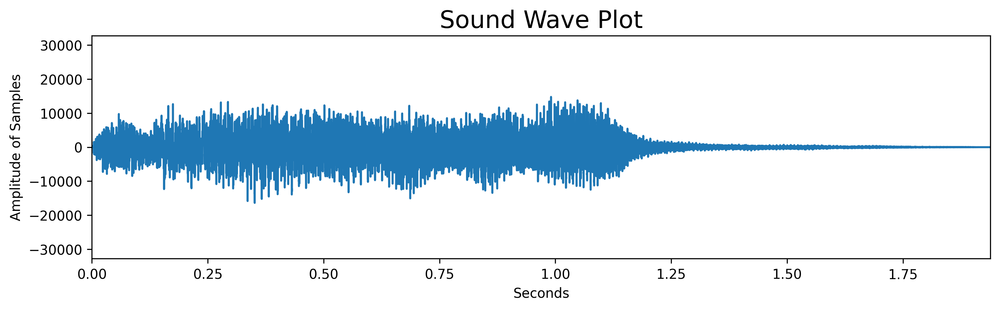

In [6]:
rate, samples = wavfile.read("files/tada.wav")
wave = SoundWave(rate,samples)
wave.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [7]:
rate, samples = wavfile.read("files/tada.wav")
s = SoundWave(rate,samples)
# Display original sound wave
IPython.display.Audio(filename="files/tada.wav")

In [8]:
s.export("files/wave1.wav")
IPython.display.Audio(filename="files/wave1.wav")

In [9]:
s.export("files/wave2.wav", True)
IPython.display.Audio(filename="files/wave2.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [10]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    #Generate the rate and samples for the given params
    rate = 44100
    x = np.linspace(0, duration, rate*duration)
    samples = np.sin(2*np.pi*x*frequency)
    # Return a sound wave
    return SoundWave(rate, samples)

In [11]:
# Note  Freq(Hz)
# A     440
# B     493.88
# C     523.25
# D     587.33
# E     659.25
# F     698.46
# G     783.99
# A     880

#Generate an A for 2 seconds
note = generate_note(440, 2)
IPython.display.Audio(note.samples, rate=note.rate)

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.

In [12]:
A = generate_note(440, 2)
C = generate_note(523.25, 2)
E = generate_note(659.25, 2)

note= A + C + E
IPython.display.Audio(note.samples, rate=note.rate)

- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A > C > E, where each tone lasts one second, and embed it in the notebook.

In [13]:
A = generate_note(440, 1)
C = generate_note(523.25, 1)
E = generate_note(659.25, 1)

note=A >> C >> E
IPython.display.Audio(note.samples, rate=note.rate)

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [14]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    n = len(samples)
    m = np.arange(n).reshape(n,1)
    W = np.exp((-2j * np.pi/n) * m @ m.T)
    return W @ samples / n

In [15]:
samples = np.array([1,6,2,4])
np.allclose(len(samples) * simple_dft(samples), fftpack.fft(samples))

True

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [16]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    def split(g):
        n = len(g)
        if n <= threshold:
            return n * simple_dft(g) # Use the function from Problem 5 for small enough g.
        else:
            even = split(g[::2])     # Get the DFT of every other entry of g, starting from 0.
            odd = split(g[1::2])     # Get the DFT of every other entry of g, starting from 1
            z = np.zeros(n, dtype=complex)
            for k in range(n):       # Calculate the exponential parts of the sum.
                z[k] = np.exp((-2j*np.pi*k)/n)
            m = n // 2               # Get the middle index for z.
            return np.concatenate((even + np.multiply(z[:m], odd), even + np.multiply(z[m:],odd))) # Concatenate two arrays of length m.
    return split(samples) / len(samples)

# Compare my function to the function from fftpack
samples = np.random.rand(8192)
np.allclose(len(samples) * simple_fft(samples), fftpack.fft(samples))

True

In [17]:
# Time my function and the fftpack function
print("My FFT Time:")
start = time.perf_counter()
simple_fft(samples)
end = time.perf_counter()
print(str(end-start))

print("\nScipy FFT Time:")
start = time.perf_counter()
fftpack.fft(samples)
end = time.perf_counter()
print(str(end-start))

My FFT Time:
0.2826982999686152

Scipy FFT Time:
0.00020849995780736208


### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

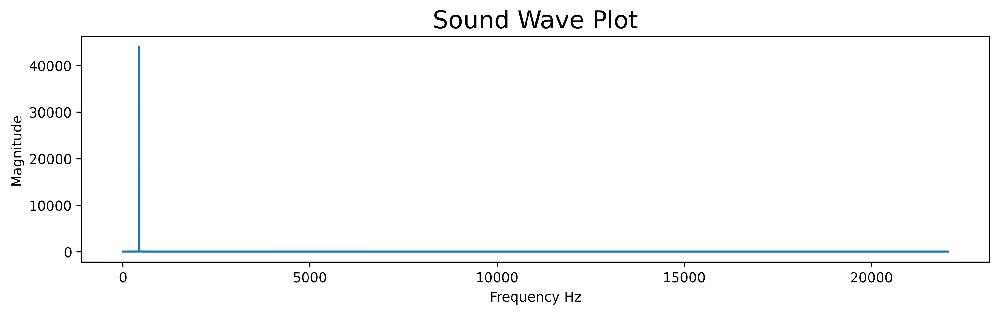

In [18]:
A = generate_note(440, 2)
generate_note(440,2).plot(prob7=True)

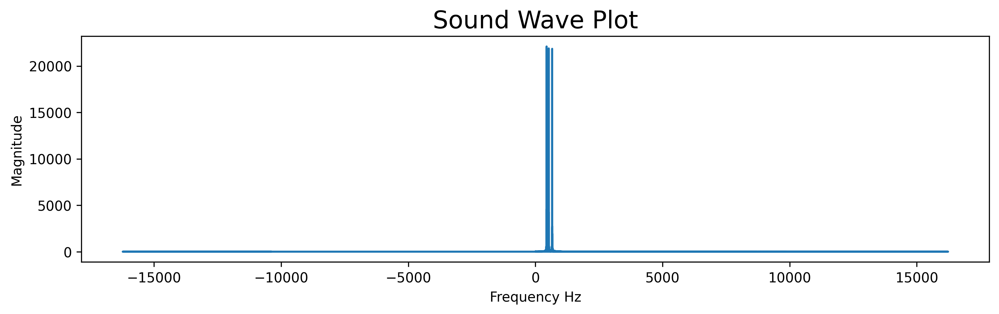

In [19]:
A = generate_note(440, 1)
C = generate_note(523.25, 1)
E = generate_note(659.25, 1)

note=A >> C >> E
SoundWave(note.rate, note.samples).plot(prob7=True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

In [20]:
rate, samples = wavfile.read("files/mystery_chord.wav")
IPython.display.Audio(samples, rate=rate)

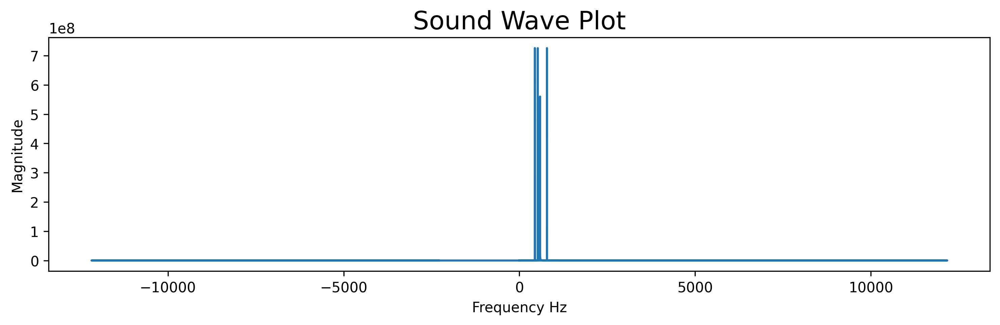

[587.5, 523.25, 784.0, 440.0]


In [21]:
SoundWave(rate, samples).plot(prob7=True)
fft_samples = fftpack.fft(samples)

m = np.abs(fft_samples[:len(fft_samples)//2])

#Sort
ind = np.argsort(m)[-4:]

N = len(samples)
hertz = [rate * k/N for k in range(0,N)]

notes = []
for i in ind:
    notes.append(hertz[i])

print(notes)

The notes are...
D, C, G, A

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [22]:
rate = 22050 # Create 2 seconds of white noise at a given rate.
white_noise = SoundWave(rate, np.random.randint(-32767, 32767, rate*2, dtype=np.int16))

conv = white_noise * wave

In [23]:
IPython.display.Audio(conv.samples, rate=conv.rate)

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [24]:
rate1, samples1 = wavfile.read("files/CGC.wav")
cgc = SoundWave(rate1,samples1)

rate2, samples2 = wavfile.read("files/GCG.wav")
gcg = SoundWave(rate2,samples2)

In [25]:
IPython.display.Audio(samples1, rate=rate1)

In [26]:
IPython.display.Audio(samples2, rate=rate2)

In [27]:
start_time = time.perf_counter() 
conv1 = cgc ** gcg
end_time = time.perf_counter()

print("SoundWave.__pow__() Time: ", end_time - start_time)

start_time = time.perf_counter()
conv2 = signal.fftconvolve(cgc, gcg)
end_time = time.perf_counter()

print("fftpack.fftconvolve() Time: ", end_time - start_time)



SoundWave.__pow__() Time:  0.054411099990829825
fftpack.fftconvolve() Time:  0.010865800024475902


In [28]:
IPython.display.Audio(conv1.samples, rate=conv1.rate)

In [29]:
IPython.display.Audio(conv2.samples, rate=conv2.rate)

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [30]:
chopin_rate, chopin_samples = wavfile.read("files/chopin.wav")
chopin_wav = SoundWave(chopin_rate, chopin_samples)

balloon_rate, balloon_samples = wavfile.read("files/balloon.wav")
balloon_wav = SoundWave(balloon_rate, balloon_samples)

balloon_chopin_conv = signal.fftconvolve(chopin_wav, balloon_wav)

IPython.display.Audio(balloon_chopin_conv.samples, rate=balloon_chopin_conv.rate)

In [31]:
IPython.display.Audio(chopin_wav.samples, rate=chopin_wav.rate)

In [32]:
IPython.display.Audio(chopin_wav.samples, rate=chopin_wav.rate)

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [33]:
noisy_rate, noisy_samp = wavfile.read("files/noisy1.wav")
noisy1 = SoundWave(noisy_rate, noisy_samp)

noisy_rate, noisy_samp = wavfile.read("files/noisy2.wav")
noisy2 = SoundWave(noisy_rate, noisy_samp)

In [34]:
IPython.display.Audio(noisy1.samples, rate=noisy1.rate)

In [35]:
clean = noisy1.clean(1250,2600)

IPython.display.Audio(clean.samples, rate=clean.rate)

In [36]:
IPython.display.Audio(noisy2.samples, rate=noisy2.rate)

In [37]:
clean = noisy2.clean(1250,4600)

IPython.display.Audio(clean.samples, rate=clean.rate)

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [38]:
vuv_rate, vuv_samp = wavfile.read("files/vuvuzela.wav")
vuv = SoundWave(vuv_rate, vuv_samp)

first_col = SoundWave(vuv_rate, vuv.samples[:,0]).clean(250, 500)
last_col = SoundWave(vuv_rate, vuv.samples[:,1]).clean(250, 500)

cleaned_vuv = SoundWave(vuv_rate, np.vstack((first_col.samples, last_col.samples)))

In [39]:
IPython.display.Audio(filename="files/vuvuzela.wav")

In [40]:
IPython.display.Audio(cleaned_vuv.samples, rate=cleaned_vuv.rate)

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

In [52]:
def plot_licence_plate(img, i, title):
    plt.subplot(2,2,i)
    plt.imshow(img, cmap="gray")
    plt.title(title, fontsize=8)
    plt.axis("off")

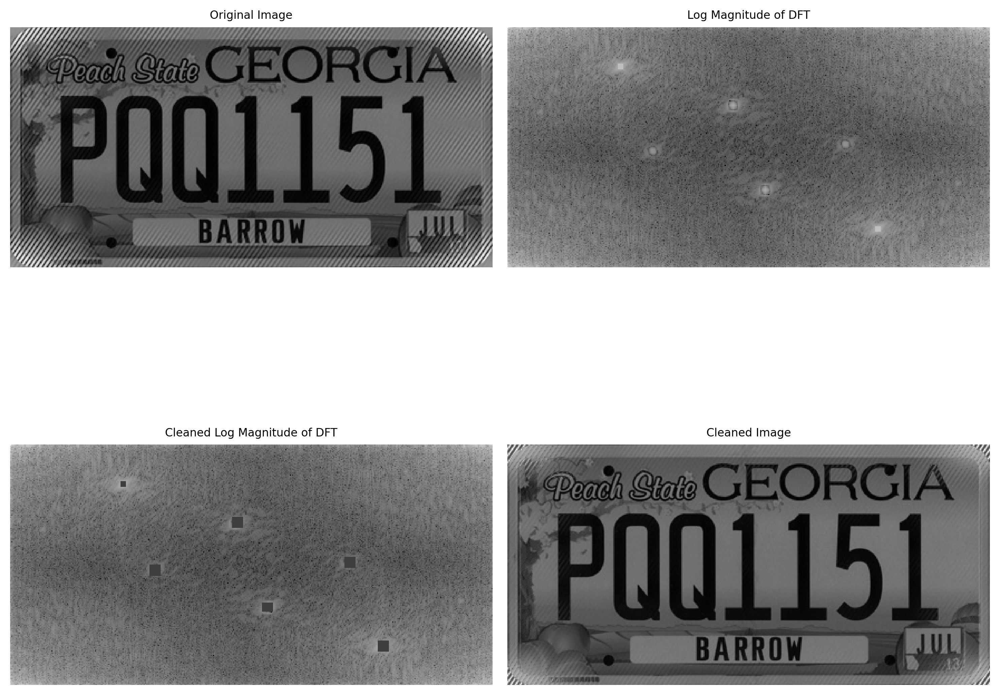

In [56]:
plt.figure(figsize=(10,10))
# Read the image.
original_licence_plate = imageio.imread("files/license_plate.png")

# Plot the image, the log magnitude of its DFT, and the cleaned image.
plot_licence_plate(original_licence_plate, 1, "Original Image")

# Plot the log magnitude of the image's DFT.
im_dft = fft2(original_licence_plate)
mean = np.mean(im_dft)

plot_licence_plate(np.log(np.abs(im_dft)), 2, "Log Magnitude of DFT")

# Clean the image from the log magnitude spikes with the mean value of the DFT.
im_dft[65:75, 199:209] = mean
im_dft[142:150, 226:236] = mean
im_dft[108:118, 125:135] = mean
im_dft[33:38, 99:104] = mean
im_dft[101:111, 300:310] = mean
im_dft[176:186, 330:340] = mean

plot_licence_plate(np.log(np.abs(im_dft)), 3, "Cleaned Log Magnitude of DFT")

# Plot the cleaned image.
A_dft_ifft = ifft2(im_dft).real
plot_licence_plate(A_dft_ifft, 4, "Cleaned Image")
plt.tight_layout()
plt.show()

The year on the sticker is 13